In [ ]:
from PIL import Image

In [4]:
# Load image
img = Image.open("lena.png")

In [5]:
# Show image mode

"""
'1': 1-bit pixels, black and white only. Each pixel is stored as a single bit (0 or 1).

'L': 8-bit pixels, grayscale. Each pixel is a shade of gray, from 0 (black) to 255 (white).

'P': 8-bit pixels, mapped to a palette. Each pixel is an index to a color in a palette of up to 256 colors.

'RGB': 3x8-bit pixels, true color. Each pixel has red, green, and blue channels with values from 0 to 255.

'RGBA': 4x8-bit pixels, true color with transparency. Like 'RGB' plus an alpha channel for transparency.

'CMYK': 4x8-bit pixels for print images, channels for cyan, magenta, yellow, and black. Used mainly in printing.

'YCbCr': 3x8-bit pixels for video images, with Y (luminance), Cb, and Cr (chrominance) channels.

'I': 32-bit signed integer pixels, used for special image types like scientific or data images.

'F': 32-bit floating point pixels, for advanced image processing or scientific use.
"""

img.mode

'P'

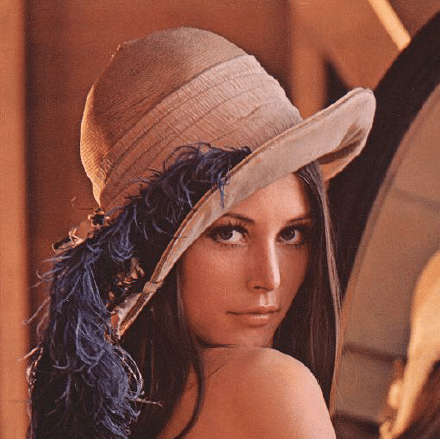

In [6]:
# Show image
img

In [7]:
# Show dimensions of img
img.size

(440, 439)

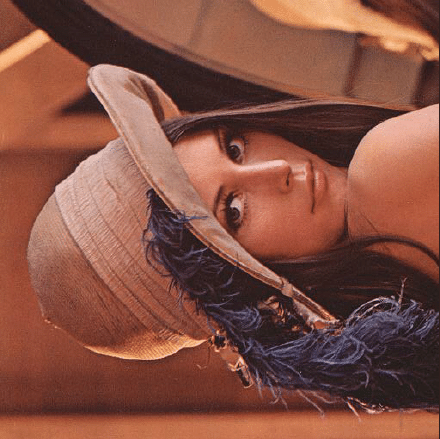

In [8]:
# Rotation demonstration
rotated_img = img.rotate(90)
rotated_img

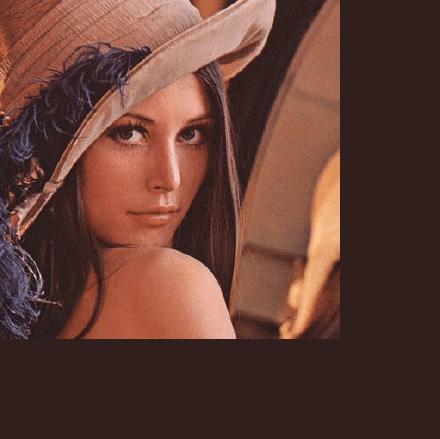

In [9]:
# Translation demonstration
translated_img = img.transform(img.size, Image.AFFINE, (1, 0, 100, 0, 1, 100))
translated_img

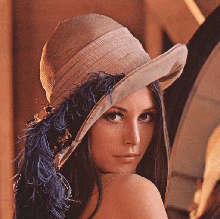

In [10]:
# Scaling demonstration
scaled_img = img.resize((img.width // 2, img.height // 2))
scaled_img

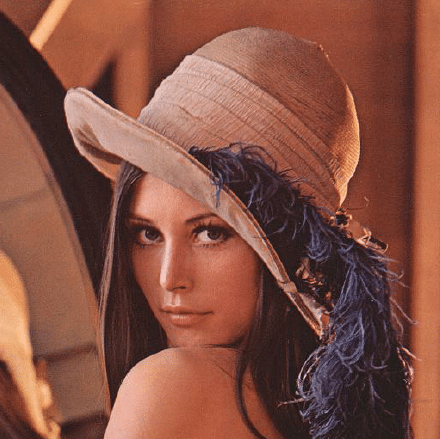

In [11]:
# Flipping demonstration
flipped_img = img.transpose(Image.FLIP_LEFT_RIGHT)
flipped_img

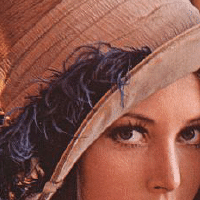

In [12]:
# Cropping demonstration
cropped_img = img.crop((100, 100, 300, 300))
cropped_img

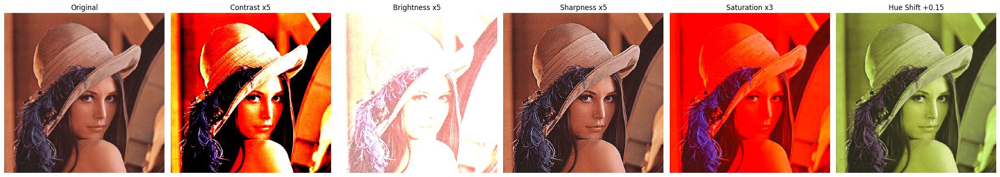

In [40]:
# Demonstration of changing contrast, brightness, and sharpness

from PIL import ImageEnhance, Image
import matplotlib.pyplot as plt
import numpy as np

if img.mode not in ['RGB', 'L']:
    img = img.convert('RGB')

contrasted_img = ImageEnhance.Contrast(img).enhance(5)

brightened_img = ImageEnhance.Brightness(img).enhance(5)

sharpened_img = ImageEnhance.Sharpness(img).enhance(5)

saturated_img = ImageEnhance.Color(img).enhance(5)

def adjust_hue(image, hue_shift=0.2):
    """
    Shift hue by a given fraction (0–1 range) of the color wheel.
    """
    img_np = np.array(image.convert("HSV"), dtype=np.uint8)
    img_np[..., 0] = (img_np[..., 0].astype(int) + int(hue_shift * 255)) % 255
    return Image.fromarray(img_np, mode="HSV").convert("RGB")

hue_shifted_img = adjust_hue(img, hue_shift=0.15)

fig, axs = plt.subplots(1, 6, figsize=(24, 5))

axs[0].imshow(img)
axs[0].set_title('Original')
axs[0].axis('off')

axs[1].imshow(contrasted_img)
axs[1].set_title('Contrast x5')
axs[1].axis('off')

axs[2].imshow(brightened_img)
axs[2].set_title('Brightness x5')
axs[2].axis('off')

axs[3].imshow(sharpened_img)
axs[3].set_title('Sharpness x5')
axs[3].axis('off')

axs[4].imshow(saturated_img)
axs[4].set_title('Saturation x3')
axs[4].axis('off')

axs[5].imshow(hue_shifted_img)
axs[5].set_title('Hue Shift +0.15')
axs[5].axis('off')

plt.tight_layout()


(np.float64(-0.5), np.float64(439.5), np.float64(438.5), np.float64(-0.5))

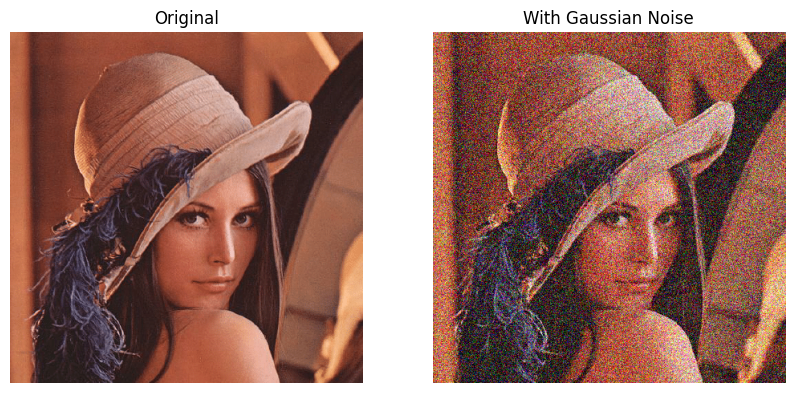

In [20]:
# Demonstration of adding Gaussian noise

import numpy as np
import matplotlib.pyplot as plt

def add_gaussian_noise(image, mean=0, std=50):
    noise = np.random.normal(mean, std, image.shape)
    noisy_image = np.clip(image + noise, 0, 255).astype(np.uint8)
    return noisy_image

# Convert image to NumPy array
img_np = np.array(img)
noisy_img_np = add_gaussian_noise(img_np)

# Plot original and noised images
fig, axs = plt.subplots(1, 2, figsize=(10, 5))
axs[0].imshow(img_np)
axs[0].set_title('Original')
axs[0].axis('off')

axs[1].imshow(noisy_img_np)
axs[1].set_title('With Gaussian Noise')
axs[1].axis('off')


(np.float64(-0.5), np.float64(439.5), np.float64(438.5), np.float64(-0.5))

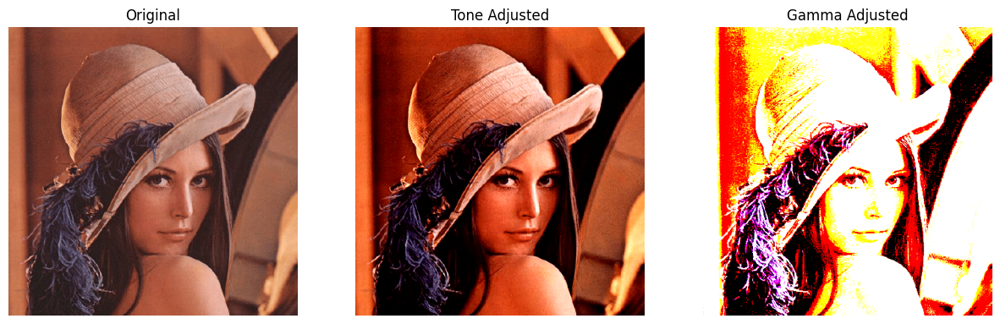

In [21]:
# Demonstration of changing tone range and gamma correction

def adjust_tone_range(image, in_min, in_max, out_min, out_max):
    image = np.clip(image, in_min, in_max)
    image = (image - in_min) / (in_max - in_min) * (out_max - out_min) + out_min
    return np.clip(image, 0, 255).astype(np.uint8)

def adjust_gamma(image, gamma=1.0):
    image = np.clip(image ** gamma, 0, 255)
    return image.astype(np.uint8)

# Apply tone range adjustment
tone_adjusted_img = adjust_tone_range(img_np, 50, 200, 0, 255)

# Apply gamma correction
gamma_adjusted_img = adjust_gamma(tone_adjusted_img, gamma=2.0)

# Plot original, tone adjusted, and gamma adjusted images
fig, axs = plt.subplots(1, 3, figsize=(15, 5))
axs[0].imshow(img_np)
axs[0].set_title('Original')
axs[0].axis('off')

axs[1].imshow(tone_adjusted_img)
axs[1].set_title('Tone Adjusted')
axs[1].axis('off')

axs[2].imshow(gamma_adjusted_img)
axs[2].set_title('Gamma Adjusted')
axs[2].axis('off')

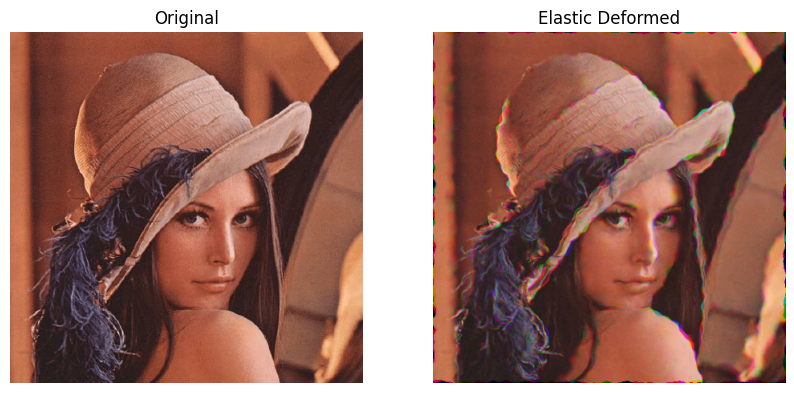

In [ ]:
# Demonstration of elastic deformation

import numpy as np
import scipy.ndimage as ndi
import matplotlib.pyplot as plt

def elastic_deformation(image, alpha, sigma):
    random_state = np.random.RandomState(None)
    shape = image.shape
    if len(shape) == 2:
        dx = ndi.gaussian_filter((random_state.rand(*shape) * 2 - 1), sigma) * alpha
        dy = ndi.gaussian_filter((random_state.rand(*shape) * 2 - 1), sigma) * alpha
        x, y = np.meshgrid(np.arange(shape[1]), np.arange(shape[0]))
        indices = np.reshape(y + dy, (-1, 1)), np.reshape(x + dx, (-1, 1))
        distorted_image = ndi.map_coordinates(image, indices, order=1).reshape(shape)
    else:
        distorted_image = np.zeros_like(image)
        for c in range(shape[2]):
            dx = ndi.gaussian_filter((random_state.rand(*shape[:2]) * 2 - 1), sigma) * alpha
            dy = ndi.gaussian_filter((random_state.rand(*shape[:2]) * 2 - 1), sigma) * alpha
            x, y = np.meshgrid(np.arange(shape[1]), np.arange(shape[0]))
            indices = np.reshape(y + dy, (-1, 1)), np.reshape(x + dx, (-1, 1))
            channel = image[..., c]
            distorted = ndi.map_coordinates(channel, indices, order=1).reshape(shape[:2])
            distorted_image[..., c] = distorted
    return distorted_image.astype(np.uint8)

# Just before plotting
elastic_img_np = elastic_deformation(img_np, alpha=34, sigma=4)

fig, axs = plt.subplots(1, 2, figsize=(10, 5))
axs[0].imshow(img_np)
axs[0].set_title('Original')
axs[0].axis('off')

axs[1].imshow(elastic_img_np)
axs[1].set_title('Elastic Deformed')
axs[1].axis('off')




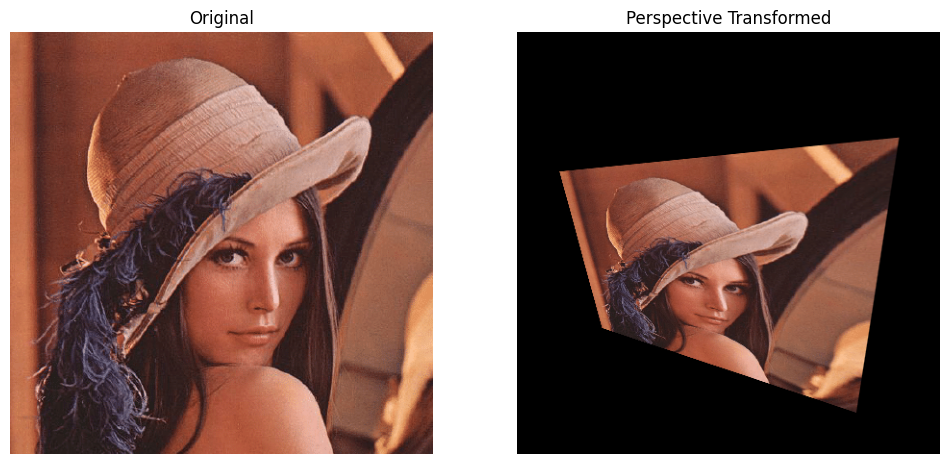

In [ ]:
# Demonstration of perspective transformation

import cv2
import numpy as np
import matplotlib.pyplot as plt

img_np = np.array(img)

# Define points in the source (original) image
rows, cols = img_np.shape[:2]
src_points = np.float32([
    [0, 0],
    [cols - 1, 0],
    [cols - 1, rows - 1],
    [0, rows - 1]
])

# Define points in the destination (transformed) image (you can modify these)
dst_points = np.float32([
    [cols*0.1, rows*0.33],
    [cols*0.9, rows*0.25],
    [cols*0.8, rows*0.9],
    [cols*0.2, rows*0.7]
])

# Compute the perspective transformation matrix
M = cv2.getPerspectiveTransform(src_points, dst_points)

# Apply the transformation
perspective_img = cv2.warpPerspective(img_np, M, (cols, rows))

# Display original and transformed images side by side
fig, axs = plt.subplots(1, 2, figsize=(12, 6))
axs[0].imshow(img_np)
axs[0].set_title('Original')
axs[0].axis('off')

axs[1].imshow(perspective_img)
axs[1].set_title('Perspective Transformed')
axs[1].axis('off')



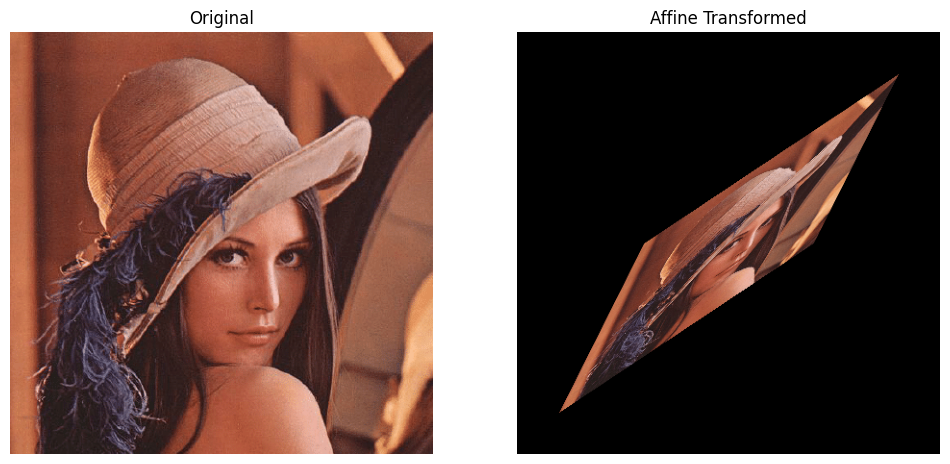

In [ ]:
# Demonstration of affine transformation

import cv2
import numpy as np
import matplotlib.pyplot as plt

img_np = np.array(img)

# Define three points in the original image
rows, cols = img_np.shape[:2]
pts1 = np.float32([
    [0, 0],
    [cols - 1, 0],
    [0, rows - 1]
])

# Define corresponding points in the transformed image
pts2 = np.float32([
    [cols*0.3, rows*0.5],
    [cols*0.9, rows*0.1],
    [cols*0.1, rows*0.9]
])

# Get the affine transformation matrix
M = cv2.getAffineTransform(pts1, pts2)

# Apply the affine transformation
affine_img = cv2.warpAffine(img_np, M, (cols, rows))

# Plot the original and affine transformed images
fig, axs = plt.subplots(1, 2, figsize=(12, 6))
axs[0].imshow(img_np)
axs[0].set_title('Original')
axs[0].axis('off')

axs[1].imshow(affine_img)
axs[1].set_title('Affine Transformed')
axs[1].axis('off')



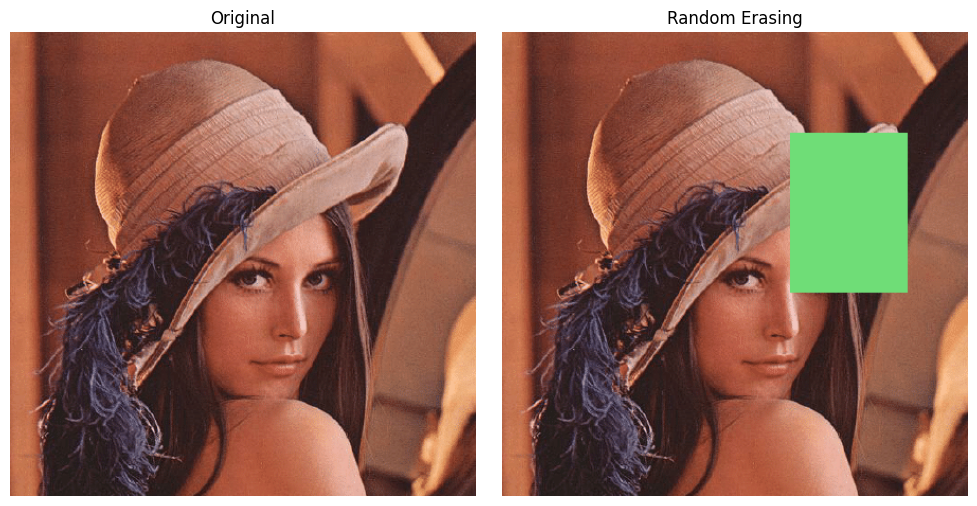

In [42]:
# Demonstration of random erasing

import numpy as np
import matplotlib.pyplot as plt
import random
from PIL import Image

def random_erasing(image, p=1.0, sl=0.02, sh=0.4, r1=0.3):
    """
    Randomly erases a rectangular region of the image.

    Parameters:
        image (PIL.Image): input image
        p (float): probability of applying the transformation
        sl, sh (float): min and max proportion of erased area
        r1 (float): min aspect ratio of erased rectangle
    """
    if random.uniform(0, 1) > p:
        return image

    img_np = np.array(image)
    h, w = img_np.shape[:2]
    area = h * w

    for _ in range(100):
        target_area = random.uniform(sl, sh) * area
        aspect_ratio = random.uniform(r1, 1 / r1)

        erase_h = int(round(np.sqrt(target_area * aspect_ratio)))
        erase_w = int(round(np.sqrt(target_area / aspect_ratio)))

        if erase_w < w and erase_h < h:
            x1 = random.randint(0, w - erase_w)
            y1 = random.randint(0, h - erase_h)
            erase_color = [random.randint(0, 255) for _ in range(3)]
            img_np[y1:y1 + erase_h, x1:x1 + erase_w, :] = erase_color
            break

    return Image.fromarray(img_np)

erased_img = random_erasing(img, p=1.0)

fig, axs = plt.subplots(1, 2, figsize=(10, 5))
axs[0].imshow(img)
axs[0].set_title('Original')
axs[0].axis('off')

axs[1].imshow(erased_img)
axs[1].set_title('Random Erasing')
axs[1].axis('off')

plt.tight_layout()


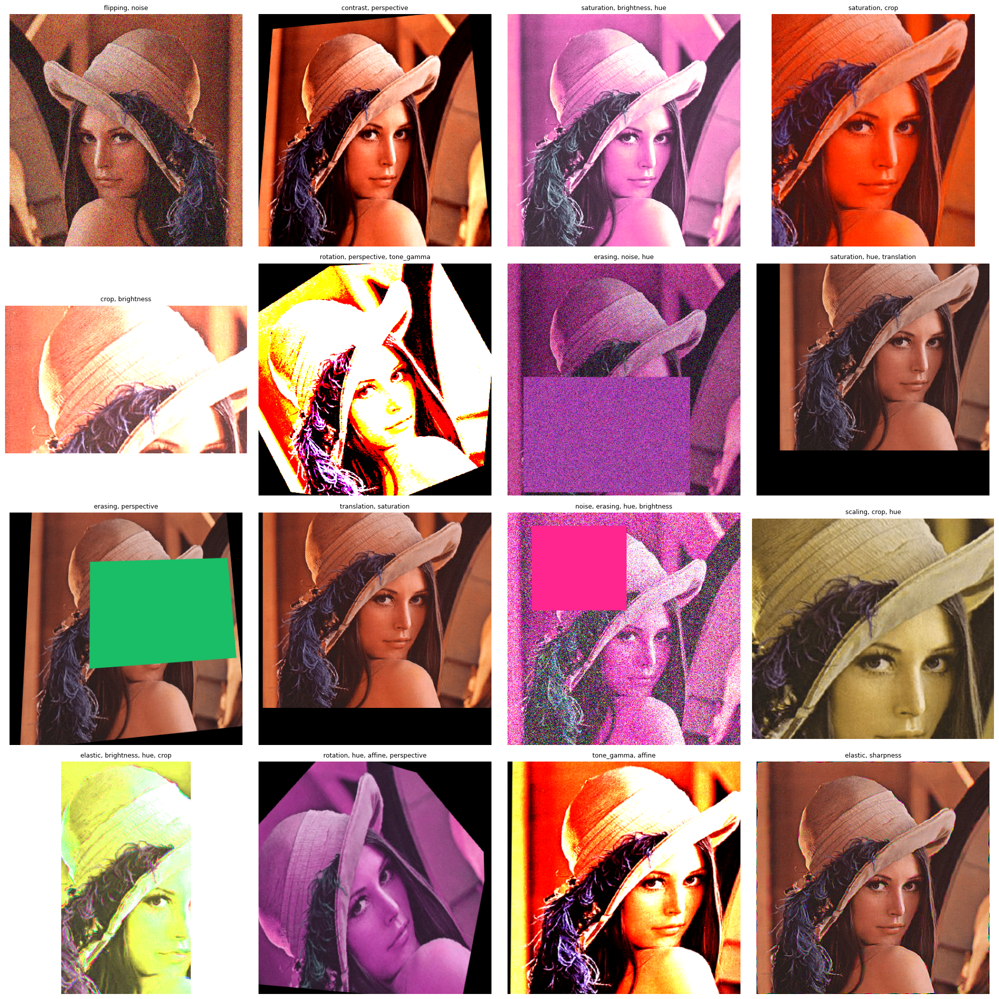

In [45]:
import random
import matplotlib.pyplot as plt
import numpy as np

# Define available transformation functions
def random_rotation(img):
    return img.rotate(random.choice([30, 45, 60, 90]))

def random_translation(img):
    tx, ty = random.randint(-100, 100), random.randint(-100, 100)
    return img.transform(img.size, Image.AFFINE, (1, 0, tx, 0, 1, ty))

def random_scaling(img):
    factor = random.uniform(0.5, 1.5)
    w, h = int(img.width * factor), int(img.height * factor)
    return img.resize((w, h))

def random_flipping(img):
    return img.transpose(random.choice([Image.FLIP_LEFT_RIGHT, Image.FLIP_TOP_BOTTOM]))

def random_crop(img):
    x1 = random.randint(0, img.width // 4)
    y1 = random.randint(0, img.height // 4)
    x2 = random.randint(img.width // 2, img.width)
    y2 = random.randint(img.height // 2, img.height)
    return img.crop((x1, y1, x2, y2))

def random_contrast(img):
    return ImageEnhance.Contrast(img).enhance(random.uniform(0.5, 3.0))

def random_brightness(img):
    return ImageEnhance.Brightness(img).enhance(random.uniform(0.5, 2.5))

def random_sharpness(img):
    return ImageEnhance.Sharpness(img).enhance(random.uniform(0.5, 5.0))

def random_saturation(img):
    return ImageEnhance.Color(img).enhance(random.uniform(0.5, 3.0))

def random_hue(img):
    hue_shift = random.uniform(-0.2, 0.2)
    img_hsv = np.array(img.convert("HSV"), dtype=np.uint8)
    img_hsv[..., 0] = (img_hsv[..., 0].astype(int) + int(hue_shift * 255)) % 255
    return Image.fromarray(img_hsv, mode="HSV").convert("RGB")

def random_noise(img):
    img_np = np.array(img)
    noisy = add_gaussian_noise(img_np, std=random.randint(10, 60))
    return Image.fromarray(noisy)

def random_tone_gamma(img):
    img_np = np.array(img)
    t_img = adjust_tone_range(img_np, 50, 200, 0, 255)
    g_img = adjust_gamma(t_img, gamma=random.uniform(0.5, 2.5))
    return Image.fromarray(g_img)

def random_elastic(img):
    img_np = np.array(img)
    e_img = elastic_deformation(img_np, alpha=random.uniform(20, 40), sigma=random.uniform(3, 6))
    return Image.fromarray(e_img)

def random_perspective(img):
    img_np = np.array(img)
    rows, cols = img_np.shape[:2]
    src = np.float32([[0, 0], [cols - 1, 0], [cols - 1, rows - 1], [0, rows - 1]])
    perturb = np.random.uniform(-cols * 0.1, cols * 0.1, src.shape)
    dst = (src + perturb).astype(np.float32)
    M = cv2.getPerspectiveTransform(src, dst)
    warped = cv2.warpPerspective(img_np, M, (cols, rows))

    return Image.fromarray(warped)


def random_affine(img):
    img_np = np.array(img)
    rows, cols = img_np.shape[:2]
    pts1 = np.float32([[0, 0], [cols - 1, 0], [0, rows - 1]])
    pts2 = pts1 + np.random.uniform(-cols * 0.2, cols * 0.2, pts1.shape)
    pts2 = pts2.astype(np.float32)
    M = cv2.getAffineTransform(pts1, pts2)
    warped = cv2.warpAffine(img_np, M, (cols, rows))

    return Image.fromarray(warped)


def random_erasing(image, p=1.0, sl=0.02, sh=0.4, r1=0.3):
    if random.uniform(0, 1) > p:
        return image

    img_np = np.array(image)
    h, w = img_np.shape[:2]
    area = h * w

    for _ in range(100):
        target_area = random.uniform(sl, sh) * area
        aspect_ratio = random.uniform(r1, 1 / r1)

        erase_h = int(round(np.sqrt(target_area * aspect_ratio)))
        erase_w = int(round(np.sqrt(target_area / aspect_ratio)))

        if erase_w < w and erase_h < h:
            x1 = random.randint(0, w - erase_w)
            y1 = random.randint(0, h - erase_h)
            erase_color = [random.randint(0, 255) for _ in range(3)]
            img_np[y1:y1 + erase_h, x1:x1 + erase_w, :] = erase_color
            break

    return Image.fromarray(img_np)


# Combine all transformations in a list
transformations = [
    random_rotation, random_translation, random_scaling, random_flipping,
    random_crop, random_contrast, random_brightness, random_sharpness,
    random_noise, random_tone_gamma, random_elastic, random_perspective, random_affine,
    random_saturation, random_hue, random_erasing
]

# Randomly apply multiple transformations per variation
N = 16
MIN_TRANSFORMS = 2
MAX_TRANSFORMS = 4

augmented_images = []
applied_transform_labels = []

for _ in range(N):
    img_aug = img.copy()
    num_transforms = random.randint(MIN_TRANSFORMS, MAX_TRANSFORMS)
    chosen_funcs = random.sample(transformations, num_transforms)
    
    for func in chosen_funcs:
        try:
            img_aug = func(img_aug)
        except Exception as e:
            print(f"⚠️ Skipping {func.__name__} due to error: {e}")
            continue

    augmented_images.append(img_aug)
    applied_transform_labels.append(
        ", ".join(f.__name__.replace("random_", "") for f in chosen_funcs)
    )

# Plot all variations
cols = 4
rows = int(np.ceil(N / cols))
fig, axs = plt.subplots(rows, cols, figsize=(5 * cols, 5 * rows))

for i, ax in enumerate(axs.flatten()):
    if i < N:
        ax.imshow(augmented_images[i])
        ax.set_title(applied_transform_labels[i], fontsize=9)
    ax.axis("off")

plt.tight_layout()


Using device: cpu
Starting Training on 938 batches...
Total epochs: 50
[Epoch 1/50] [D loss: 0.5823] [G loss: 2.1614]


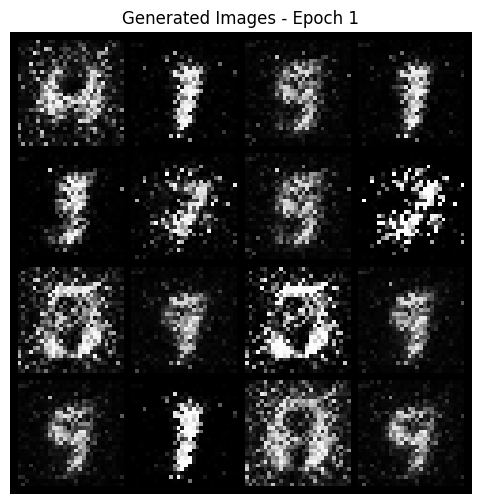

[Epoch 2/50] [D loss: 0.4827] [G loss: 1.2162]
[Epoch 3/50] [D loss: 0.2876] [G loss: 1.9090]
[Epoch 4/50] [D loss: 0.4420] [G loss: 1.1335]
[Epoch 5/50] [D loss: 0.4646] [G loss: 3.4275]


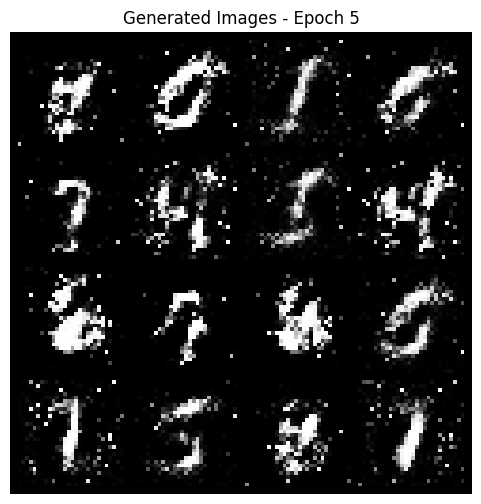

[Epoch 6/50] [D loss: 0.5143] [G loss: 1.7390]
[Epoch 7/50] [D loss: 0.5751] [G loss: 1.0484]
[Epoch 8/50] [D loss: 0.5748] [G loss: 0.5958]
[Epoch 9/50] [D loss: 0.3986] [G loss: 1.8097]
[Epoch 10/50] [D loss: 0.4654] [G loss: 0.9981]


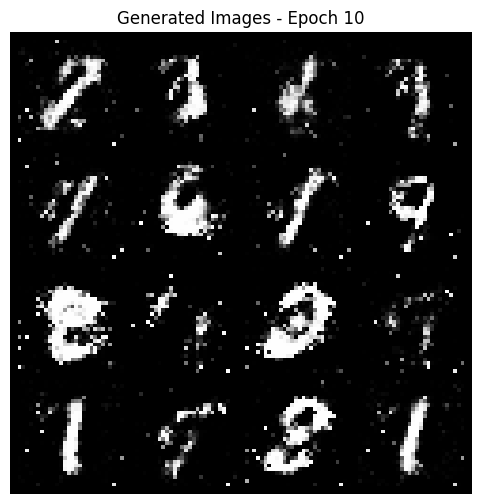

[Epoch 11/50] [D loss: 0.4271] [G loss: 1.1854]
[Epoch 12/50] [D loss: 0.5190] [G loss: 2.6806]
[Epoch 13/50] [D loss: 0.4233] [G loss: 2.0331]
[Epoch 14/50] [D loss: 0.5231] [G loss: 2.1554]
[Epoch 15/50] [D loss: 0.3920] [G loss: 1.5796]


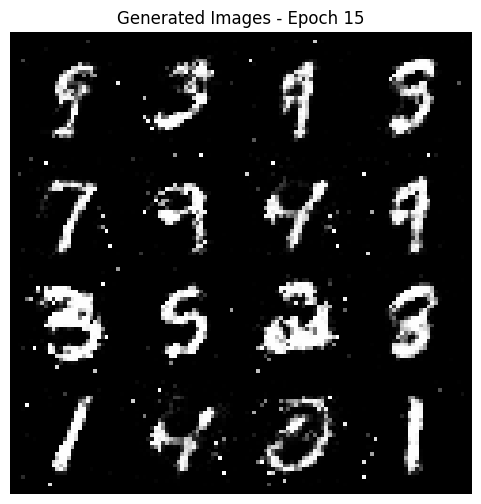

[Epoch 16/50] [D loss: 0.5084] [G loss: 2.0317]
[Epoch 17/50] [D loss: 0.4993] [G loss: 0.9422]
[Epoch 18/50] [D loss: 0.3891] [G loss: 2.2261]
[Epoch 19/50] [D loss: 0.4617] [G loss: 0.8705]
[Epoch 20/50] [D loss: 0.3977] [G loss: 1.5951]


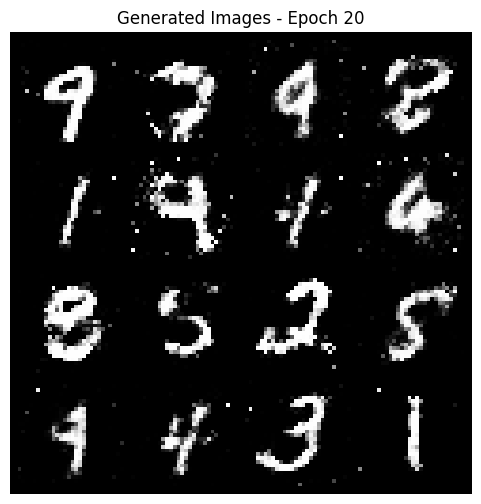

[Epoch 21/50] [D loss: 0.4178] [G loss: 1.5270]
[Epoch 22/50] [D loss: 0.5046] [G loss: 1.4068]
[Epoch 23/50] [D loss: 0.5189] [G loss: 2.1182]
[Epoch 24/50] [D loss: 0.4913] [G loss: 0.9142]
[Epoch 25/50] [D loss: 0.4426] [G loss: 1.2695]


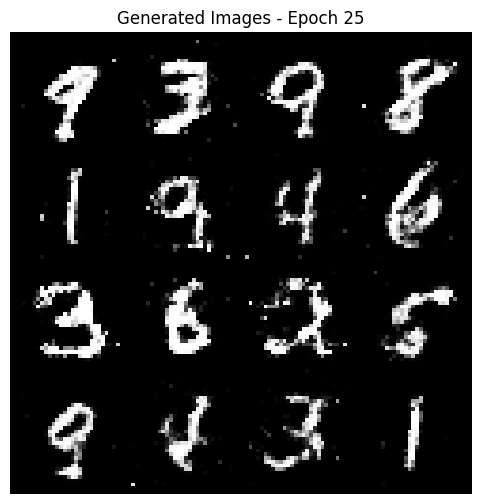

[Epoch 26/50] [D loss: 0.5372] [G loss: 1.8404]
[Epoch 27/50] [D loss: 0.4939] [G loss: 1.6630]
[Epoch 28/50] [D loss: 0.4790] [G loss: 1.7026]
[Epoch 29/50] [D loss: 0.5698] [G loss: 1.1271]
[Epoch 30/50] [D loss: 0.5374] [G loss: 0.7581]


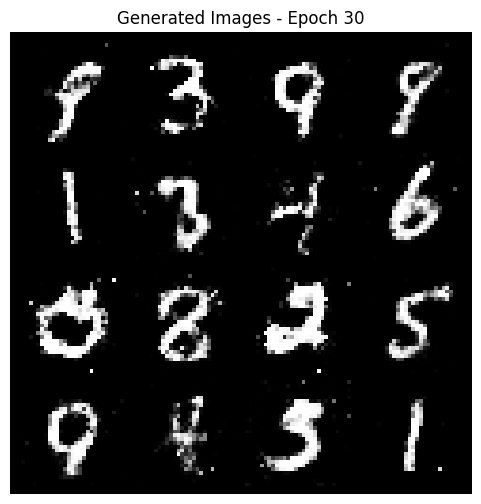

[Epoch 31/50] [D loss: 0.5016] [G loss: 1.0775]
[Epoch 32/50] [D loss: 0.5005] [G loss: 1.2732]
[Epoch 33/50] [D loss: 0.3790] [G loss: 1.8224]
[Epoch 34/50] [D loss: 0.5347] [G loss: 1.2644]
[Epoch 35/50] [D loss: 0.4222] [G loss: 1.6164]


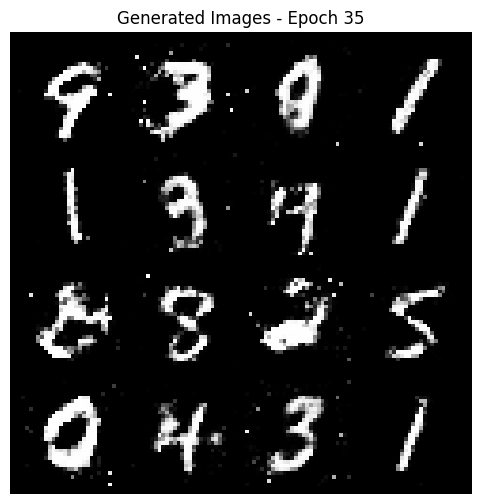

[Epoch 36/50] [D loss: 0.4488] [G loss: 1.7620]
[Epoch 37/50] [D loss: 0.4885] [G loss: 1.4337]
[Epoch 38/50] [D loss: 0.4207] [G loss: 1.5514]
[Epoch 39/50] [D loss: 0.3488] [G loss: 1.4978]
[Epoch 40/50] [D loss: 0.4783] [G loss: 1.4759]


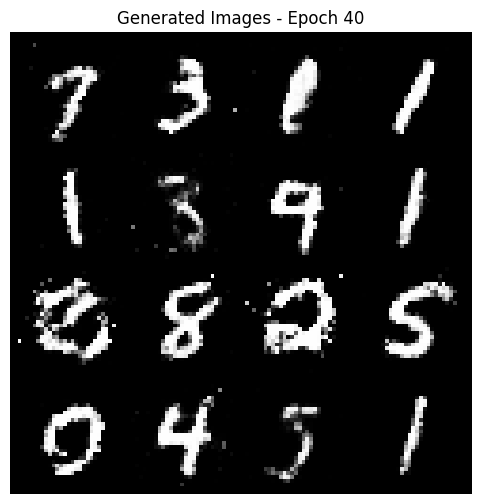

[Epoch 41/50] [D loss: 0.4026] [G loss: 1.7297]
[Epoch 42/50] [D loss: 0.3384] [G loss: 2.2290]
[Epoch 43/50] [D loss: 0.4055] [G loss: 1.8274]
[Epoch 44/50] [D loss: 0.3638] [G loss: 1.7101]
[Epoch 45/50] [D loss: 0.4006] [G loss: 1.7565]


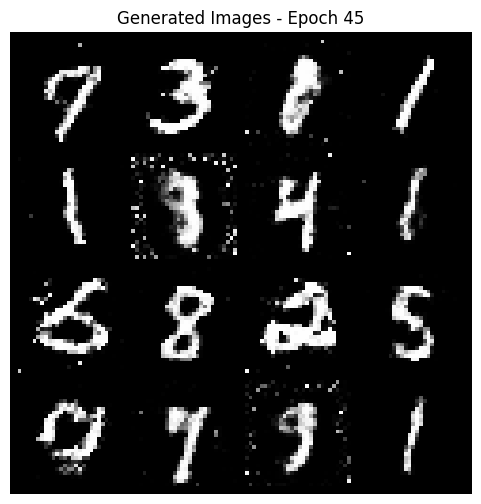

[Epoch 46/50] [D loss: 0.3481] [G loss: 1.6074]
[Epoch 47/50] [D loss: 0.4063] [G loss: 1.5736]
[Epoch 48/50] [D loss: 0.4984] [G loss: 0.9844]
[Epoch 49/50] [D loss: 0.4551] [G loss: 2.2294]
[Epoch 50/50] [D loss: 0.5571] [G loss: 2.5780]


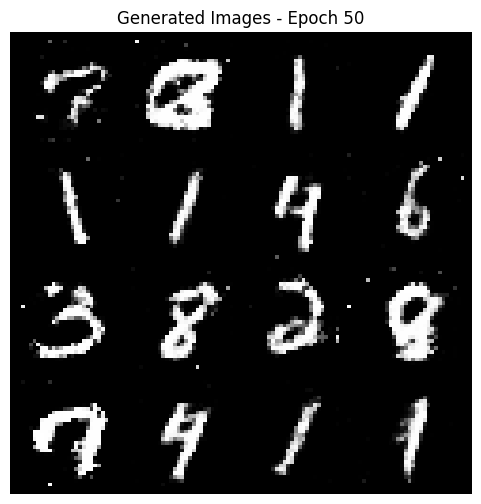

✅ Training Complete!


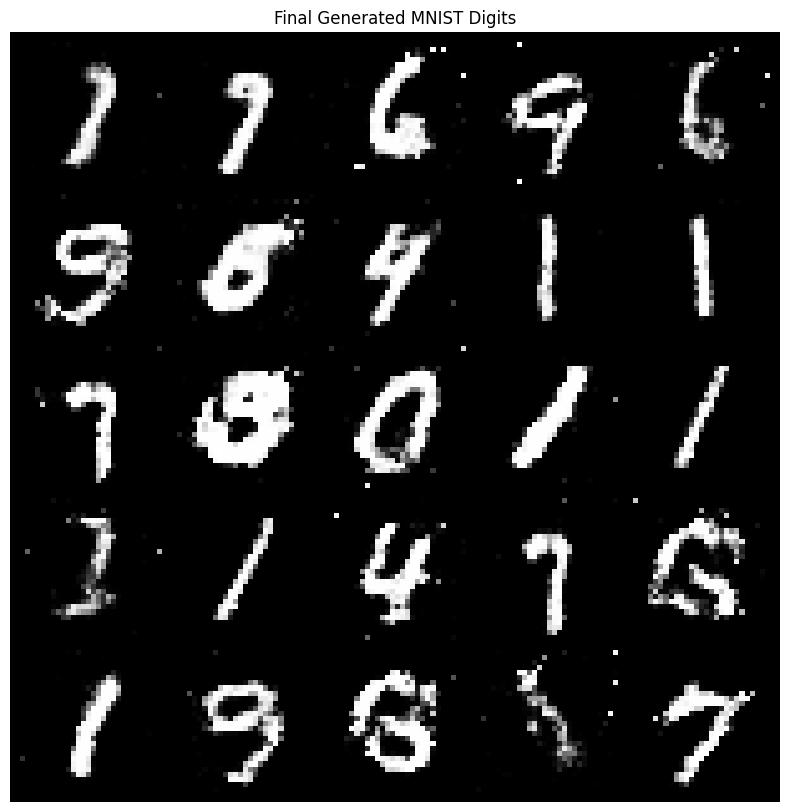

In [61]:
# === FULLY WORKING VANILLA GAN ON MNIST ===
# Based on proven implementations from PyTorch community
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
import torchvision.utils as vutils
import matplotlib.pyplot as plt
import numpy as np

# Hyperparameters
img_size = 28
channels = 1
latent_dim = 100
lr = 0.0002
batch_size = 64
n_epochs = 50
sample_interval = 5

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

# Data preprocessing
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize([0.5], [0.5])
])

# Load MNIST dataset
dataloader = DataLoader(
    datasets.MNIST('./data', train=True, download=True, transform=transform),
    batch_size=batch_size,
    shuffle=True
)

# Generator Network
class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        
        def block(in_feat, out_feat, normalize=True):
            layers = [nn.Linear(in_feat, out_feat)]
            if normalize:
                layers.append(nn.BatchNorm1d(out_feat, 0.8))
            layers.append(nn.LeakyReLU(0.2, inplace=True))
            return layers
        
        self.model = nn.Sequential(
            *block(latent_dim, 128, normalize=False),
            *block(128, 256),
            *block(256, 512),
            *block(512, 1024),
            nn.Linear(1024, channels * img_size * img_size),
            nn.Tanh()
        )
    
    def forward(self, z):
        img = self.model(z)
        img = img.view(img.size(0), channels, img_size, img_size)
        return img

# Discriminator Network
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        
        self.model = nn.Sequential(
            nn.Linear(channels * img_size * img_size, 512),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(512, 256),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(256, 1),
            nn.Sigmoid()
        )
    
    def forward(self, img):
        img_flat = img.view(img.size(0), -1)
        validity = self.model(img_flat)
        return validity

# Initialize models
generator = Generator().to(device)
discriminator = Discriminator().to(device)

# Loss function
adversarial_loss = nn.BCELoss()

# Optimizers
optimizer_G = optim.Adam(generator.parameters(), lr=lr, betas=(0.5, 0.999))
optimizer_D = optim.Adam(discriminator.parameters(), lr=lr, betas=(0.5, 0.999))

# Fixed noise for consistent visualization
fixed_noise = torch.randn(16, latent_dim, device=device)

# Training
print(f"Starting Training on {len(dataloader)} batches...")
print(f"Total epochs: {n_epochs}")

for epoch in range(n_epochs):
    for i, (imgs, _) in enumerate(dataloader):
        
        # Configure input
        real_imgs = imgs.to(device)
        batch_size = real_imgs.size(0)
        
        # Adversarial ground truths
        valid = torch.ones(batch_size, 1, device=device)
        fake = torch.zeros(batch_size, 1, device=device)
        
        # ---------------------
        #  Train Discriminator
        # ---------------------
        optimizer_D.zero_grad()
        
        # Measure discriminator's ability to classify real images
        real_loss = adversarial_loss(discriminator(real_imgs), valid)
        
        # Measure discriminator's ability to classify fake images
        z = torch.randn(batch_size, latent_dim, device=device)
        fake_imgs = generator(z)
        fake_loss = adversarial_loss(discriminator(fake_imgs.detach()), fake)
        
        # Total discriminator loss
        d_loss = (real_loss + fake_loss) / 2
        d_loss.backward()
        optimizer_D.step()
        
        # -----------------
        #  Train Generator
        # -----------------
        optimizer_G.zero_grad()
        
        # Generate a batch of images
        gen_imgs = generator(z)
        
        # Generator loss measures ability to fool discriminator
        g_loss = adversarial_loss(discriminator(gen_imgs), valid)
        g_loss.backward()
        optimizer_G.step()
    
    # Print progress
    print(f"[Epoch {epoch+1}/{n_epochs}] [D loss: {d_loss.item():.4f}] [G loss: {g_loss.item():.4f}]")
    
    # Generate and display images at sample intervals
    if (epoch + 1) % sample_interval == 0 or epoch == 0:
        with torch.no_grad():
            generated = generator(fixed_noise).detach().cpu()
        
        grid = vutils.make_grid(generated, nrow=4, normalize=True, value_range=(-1, 1))
        
        plt.figure(figsize=(6, 6))
        plt.axis("off")
        plt.title(f"Generated Images - Epoch {epoch+1}")
        plt.imshow(np.transpose(grid, (1, 2, 0)))
        plt.show()

print("✅ Training Complete!")

# Generate final images
with torch.no_grad():
    z = torch.randn(25, latent_dim, device=device)
    generated_imgs = generator(z).detach().cpu()

grid = vutils.make_grid(generated_imgs, nrow=5, normalize=True, value_range=(-1, 1))

plt.figure(figsize=(10, 10))
plt.axis("off")
plt.title("Final Generated MNIST Digits")
plt.imshow(np.transpose(grid, (1, 2, 0)))
plt.show()